# Visual Odometry (VO)

In this part, you will use the pykitti module and KITTI odometry dataset.

You can download the odometry data from [here](https://drive.google.com/file/d/1PJOUnM3nEwDpqiRvfqUnkNPJZpM4PKYV/view?usp=sharing).

## Monocular VO with OpenCV on KITTI

For each consecutive frame pair in the sequence, you will compute the relative pose between the frames and visualize it. You will use:

* pykitti code similar to what you wrote in pykitti part to load the seqeunce with ground-truth info. (Check out the [demo code for odometry dataset](https://github.com/utiasSTARS/pykitti/blob/master/demos/demo_odometry.py))
* OpenCV functions to compute and visualize the features and the essential matrix.

Please follow these steps to complete the assignment:

1. You can use the ORB Feature to do the feature matching:
    `orb = cv2.ORB_create()` to create the ORB object
    and then `orb.detectAndCompute()` to find the keypoints and descriptors on both frames

2. You can use brute-force matcher to match ORB descriptors:
    `bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)`

3. After matching the descriptors, sort the matched keypoints.

4. Draw matches on the two images using the `cv2.drawMatches()` function.

5. Compute the essential matrix using the `cv2.findEssentialMat()` function. Note that you need the matching points and the instrinsics for this function. 

6. Extract the rotation and translation from the essential matrix using the `cv2.recoverPose()` function.

7. Multiply the estimated rotation and translation with the previous rotation and translation. Initialize rotation to identity and translation to zeros on the first frame.

8. Display the current image with the keypoints on it using the `cv2.drawKeypoints()` function.

9. Update the previous rotation and translation as the current rotation and translation.

10. Draw the estimated trajectory as blue and ground-truth trajectory as green. You can use the `cv2.circle()` function.


You can create a video of your visualization of images and poses for the provided sequence.

**Bonus**: Compute the absolute trajectory error between the estimated trajectory and the ground-truth trajectory. 

Some examples repositories that might be useful:
* https://bitbucket.org/castacks/visual_odometry_tutorial/src/master/visual-odometry/
* https://github.com/uoip/monoVO-python


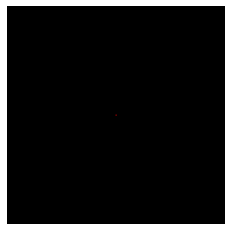

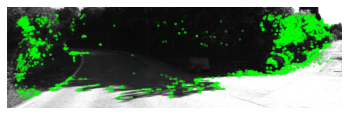

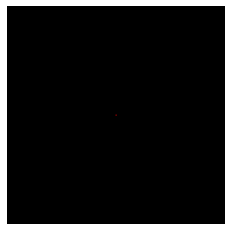

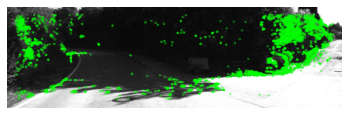

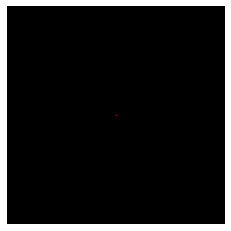

...

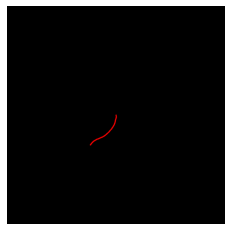

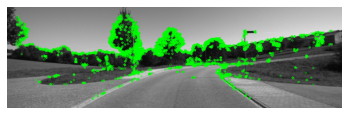

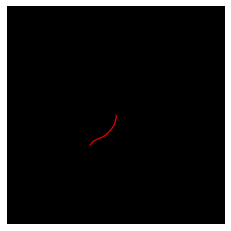

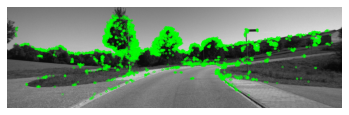

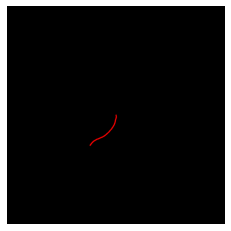

True

In [101]:
"""Example of pykitti.odometry usage."""
import itertools
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import cv2


import pykitti

def rot2quat(R):
  
    qw = 0.5 * np.sqrt(1 + R[0, 0] + R[1, 1] + R[2, 2])
    qx = (R[2, 1] - R[1, 2]) / (4 * qw)
    qy = (R[0, 2] - R[2, 0]) / (4 * qw)
    qz = (R[1, 0] - R[0, 1]) / (4 * qw)
    return qw, qx, qy, qz

basedir = '/Users/Dell/Desktop/KITTI_odometry'
sequence = '09'

# Load the data. Optionally, specify the frame range to load.
# dataset = pykitti.odometry(basedir, sequence)
#dataset = pykitti.odometry(basedir, sequence)

#gt_pose_dir = args.data_dir_root + 'kitti-odom/' + 'data_odometry_poses/dataset/poses/' + seq + '.txt'
#img_data_dir = args.data_dir_root + 'kitti-odom/' + 'data_odometry_color/dataset/sequences/' + seq + '/image_2/'

gt_pose_dir='/Users/Dell/Desktop/KITTI_odometry/poses/09.txt'
img_data_dir='/Users/Dell/Desktop/KITTI_odometry/sequences/09/image_2'

width = 1241.0
height = 376.0
fx, fy, cx, cy = [718.8560, 718.8560, 607.1928, 185.2157]
trajMap = np.zeros((1000, 1000, 3), dtype=np.uint8)
out_pose_file = 'KITTI-09-traj_est.txt'

img_list = glob(img_data_dir + '/*.png')
img_list.sort()
num_frames = len(img_list)


for i in range(num_frames):
    curr_img = cv2.imread(img_list[i], 0)

    if i == 0:
        curr_R = np.eye(3)
        curr_t = np.array([0, 0, 0])
    else:
        prev_img = cv2.imread(img_list[i-1], 0)

       
        orb = cv2.ORB_create(nfeatures=6000)
        kp1, des1 = orb.detectAndCompute(prev_img, None)
        kp2, des2 = orb.detectAndCompute(curr_img, None)

        bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)

        pts1 = np.float32([kp1[m.queryIdx].pt for m in matches])
        pts2 = np.float32([kp2[m.trainIdx].pt for m in matches])

        E, mask = cv2.findEssentialMat(pts1, pts2, focal=fx, pp=(cx, cy), method=cv2.RANSAC, prob=0.999, threshold=1)
        pts1 = pts1[mask.ravel() == 1]
        pts2 = pts2[mask.ravel() == 1]
        _, R, t, mask = cv2.recoverPose(E, pts1, pts2, focal=fx, pp=(cx, cy))

        R = R.transpose()
        t = -np.matmul(R, t)

        if i == 1:
            curr_R = R
            curr_t = t
        else:
            curr_R = np.matmul(prev_R, R)
            curr_t = np.matmul(prev_R, t) + prev_t

        curr_img_kp = cv2.drawKeypoints(curr_img, kp2, None, color=(0, 255, 0), flags=0)
       # cv2.imshow('keypoints from current image', curr_img_kp)
        plt.figure()
        plt.imshow(curr_img_kp)
        plt.axis('off')
        plt.show()
        
    [tx, ty, tz] = [curr_t[0], curr_t[1], curr_t[2]]
    qw, qx, qy, qz = rot2quat(curr_R)
    with open(out_pose_file, 'a') as f:
        f.write('%f %f %f %f %f %f %f %f\n' % (0.0, tx, ty, tz, qx, qy, qz, qw))

    prev_R = curr_R
    prev_t = curr_t

        
    offset_draw = (int(1000/2))
    cv2.circle(trajMap, (int(curr_t[0])+offset_draw, int(curr_t[2])+offset_draw), 1, (255,0,0), 2)
    plt.figure()
    plt.imshow(trajMap)
    plt.axis('off')
    plt.show()
    #cv2.imshow('Trajectory', trajMap)
    cv2.waitKey(1)

cv2.imwrite('trajMap.png', trajMap)









